## 0. Imports 


In [ ]:
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import mne
import ipywidgets as widgets
from scipy import stats
from mne.stats import permutation_cluster_test, f_oneway, ttest_ind_no_p

# Plot/browser settings
matplotlib.use("TkAgg")
%matplotlib inline
mne.utils.config.set_config("MNE_BROWSE_RAW_SIZE", "16.0,8.0")

# Reproducibility
RANDOM_STATE = 42


## 1. Configuration


In [2]:
# =============================================================================
# File paths
# =============================================================================
DATA_DIR = Path.cwd()
RAW_FILE = DATA_DIR / "forsøgs_data" / "Asger_Nanna_Freja_2.bdf"

# =============================================================================
# Event IDs
# =============================================================================
EVENT_ID_FULL_STOP = {
    "auto/full_stop/win": 131,
    "auto/full_stop/near_miss": 132,
    "auto/full_stop/miss": 133,
    "manual/full_stop/win": 231,
    "manual/full_stop/near_miss": 232,
    "manual/full_stop/miss": 233,
}

# =============================================================================
# Condition groups
# =============================================================================
OUTCOME_GROUPS = {
    "Win": ["auto/full_stop/win", "manual/full_stop/win"],
    "Near-loss": ["auto/full_stop/near_miss", "manual/full_stop/near_miss"],
    "Full-loss": ["auto/full_stop/miss", "manual/full_stop/miss"],
}

SPN_GROUPS = {
    "AA / possible win": (
        OUTCOME_GROUPS["Win"] + OUTCOME_GROUPS["Near-loss"]
    ),
    "AB / total miss": OUTCOME_GROUPS["Full-loss"],
}

COLORS = {
    "Win": "#FF8F17",
    "Near-loss": "#D130AA",
    "Full-loss": "#160090",
    "AA / possible win": "#DD311B",
    "AB / total miss": "#160090",
}

# =============================================================================
# Analysis windows
# =============================================================================
WINDOWS = {
    "SPN": {
        "channel": "Cz",
        "stat": (-0.100, 0.000),
        "plot": (-0.300, 0.100),
        "baseline": (-2.400, -2.300),
    },
    "RewP": {
        "channel": "FCz",
        "stat": (0.228, 0.344),
        "plot": (-0.100, 0.600),
        "baseline": (-0.100, 0.000),
    },
    "LPP": {
        "channel": "Pz",
        "stat": (0.600, 0.800),
        "plot": (-0.100, 0.900),
        "baseline": (-0.100, 0.000),
    },
}

N_PERMUTATIONS = 5000
ALPHA = 0.05
CLUSTER_ALPHA = 0.05


## 2. Helper functions


In [19]:
def inspect_raw(craw, start, chan_sel, nchan=10, time_step=2, events=None):
    """Interactive helper for browsing raw data in channel blocks."""
    order = np.arange(nchan, dtype=int) + int(nchan * (chan_sel - 1))
    order = order[order < len(craw.ch_names)]
    craw.plot(
        events=events,
        start=start,
        duration=time_step,
        order=order,
        show_scrollbars=False,
    )


def raw_interact(craw, time_step=2, nchan=10, events=None):
    """Interactive raw-data browser."""
    return widgets.interact(
        inspect_raw,
        craw=widgets.fixed(craw),
        nchan=widgets.fixed(nchan),
        time_step=widgets.fixed(time_step),
        events=widgets.fixed(events),
        start=widgets.FloatSlider(
            value=0,
            min=0,
            max=craw.times[-1],
            step=time_step,
            description="time",
        ),
        chan_sel=widgets.IntSlider(
            value=1,
            min=1,
            max=int(np.ceil(len(craw.ch_names) / nchan)),
            step=1,
            description="channels",
        ),
    )


def make_erps(epochs):
    """Create one evoked object per condition."""
    return {condition: epochs[condition].average() for condition in epochs.event_id.keys()}


def concatenate_conditions(epochs, conditions):
    """Concatenate single-trial epochs from a list of condition names."""
    return mne.concatenate_epochs([epochs[condition] for condition in conditions])


def get_trial_data(epochs, conditions, channel, tmin, tmax, *, unit="V"):
    """
    Return single-trial data for selected conditions, channel, and time window.

    Output shape: trials x time.
    """
    selected_epochs = concatenate_conditions(epochs, conditions)
    cropped = selected_epochs.copy().pick(channel).crop(tmin=tmin, tmax=tmax)
    data = cropped.get_data()[:, 0, :]
    if unit == "uV":
        data = data * 1e6
    return data, cropped.times * 1000, selected_epochs


def summarise_trial_means(X_uv, label):
    """Summarise trial-level mean amplitudes from data already converted to µV."""
    trial_means = X_uv.mean(axis=1)
    return {
        "condition": label,
        "n": len(trial_means),
        "mean": trial_means.mean(),
        "sd": trial_means.std(ddof=1),
        "sem": trial_means.std(ddof=1) / np.sqrt(len(trial_means)),
    }


def print_summary_table(summaries, component):
    """Print a compact descriptive table."""
    df = pd.DataFrame(summaries)
    print(f"\nTrial-level {component} amplitude summary")
    print("-" * (len(component) + 31))
    print(df.round(3).to_string(index=False))
    return df


def run_two_condition_cluster_test(X1, X2, times_ms, label1, label2):
    """Run a two-sided independent-samples cluster permutation t-test."""
    n1, n2 = X1.shape[0], X2.shape[0]
    df = n1 + n2 - 2
    threshold = stats.t.ppf(1 - CLUSTER_ALPHA / 2, df=df)

    T_obs, clusters, cluster_p_values, H0 = permutation_cluster_test(
        [X1, X2],
        stat_fun=ttest_ind_no_p,
        threshold=threshold,
        n_permutations=N_PERMUTATIONS,
        tail=0,
        out_type="indices",
        seed=RANDOM_STATE,
    )

    print(f"\nCluster-based permutation test: {label1} vs {label2}")
    print("-" * 58)
    print(f"{label1} trials: {n1}")
    print(f"{label2} trials: {n2}")
    print(f"Degrees of freedom: {df}")

    significant = False
    for i, p_value in enumerate(cluster_p_values):
        cluster_indices = clusters[i][0]
        cluster_times = times_ms[cluster_indices]
        print(f"\nCluster {i + 1}")
        print(f"p = {p_value:.4f}")
        print(f"time window = {cluster_times[0]:.1f} to {cluster_times[-1]:.1f} ms")
        print(f"mean t-value = {T_obs[cluster_indices].mean():.3f}")
        if p_value < ALPHA:
            significant = True
            print("SIGNIFICANT")

    if not significant:
        print("\nNo significant clusters were found.")

    return T_obs, clusters, cluster_p_values, H0


def run_three_condition_cluster_test(X_list, times_ms, labels, component):
    """Run a one-way cluster permutation F-test for three outcome conditions."""
    n_groups = len(X_list)
    n_total = sum(X.shape[0] for X in X_list)
    df_between = n_groups - 1
    df_within = n_total - n_groups

    threshold = stats.f.ppf(1 - CLUSTER_ALPHA, df_between, df_within)

    F_obs, clusters, cluster_p_values, H0 = permutation_cluster_test(
        X_list,
        stat_fun=f_oneway,
        threshold=threshold,
        n_permutations=N_PERMUTATIONS,
        tail=1,
        out_type="indices",
        seed=RANDOM_STATE,
    )

    print(f"\nCluster-based permutation test: {component} outcome effect")
    print("-" * 62)
    for label, X in zip(labels, X_list):
        print(f"{label} trials: {X.shape[0]}")
    print(f"df_between = {df_between}")
    print(f"df_within = {df_within}")

    significant = False
    for i, p_value in enumerate(cluster_p_values):
        cluster_indices = clusters[i][0]
        cluster_times = times_ms[cluster_indices]
        print(f"\nCluster {i + 1}")
        print(f"p = {p_value:.4f}")
        print(f"time window = {cluster_times[0]:.1f} to {cluster_times[-1]:.1f} ms")
        print(f"mean F-value = {F_obs[cluster_indices].mean():.3f}")
        if p_value < ALPHA:
            significant = True
            print("SIGNIFICANT")

    if not significant:
        print("\nNo significant clusters were found.")

    return F_obs, clusters, cluster_p_values, H0




def plot_two_condition_waveforms(
    epochs,
    groups,
    component,
    channel,
    stat_window,
    plot_window,
    cluster_results=None,
    ylim=None,
):
    """Plot two condition groups with SEM ribbons and descriptive legend labels"""

    plt.figure(figsize=(9, 5))

    for label, conditions in groups.items():

        # ---------------------------------------------------------------------
        # Extract full plotting-window data
        # ---------------------------------------------------------------------
        # X_uv shape: trials x time
        # Data are converted to microvolts inside get_trial_data using unit="uV"

        X_uv, times_ms, _ = get_trial_data(
            epochs=epochs,
            conditions=conditions,
            channel=channel,
            tmin=plot_window[0],
            tmax=plot_window[1],
            unit="uV"
        )

        # ---------------------------------------------------------------------
        # Mean waveform and SEM waveform
        # ---------------------------------------------------------------------

        mean_wave = X_uv.mean(axis=0)

        sem_wave = (
            X_uv.std(axis=0, ddof=1)
            / np.sqrt(X_uv.shape[0])
        )

        # ---------------------------------------------------------------------
        # Descriptive statistics for the legend
        # ---------------------------------------------------------------------
        # This averages each trial over the plotting window.
        # If you want these labels to reflect the statistical window instead,
        # see note below.

        summary = summarise_trial_means(X_uv, label)

        legend_label = (
            f"{label} "
        )

        # ---------------------------------------------------------------------
        # Plot SEM ribbon
        # ---------------------------------------------------------------------

        plt.fill_between(
            times_ms,
            mean_wave - sem_wave,
            mean_wave + sem_wave,
            color=COLORS[label],
            alpha=0.18,
        )

        # ---------------------------------------------------------------------
        # Plot mean waveform
        # ---------------------------------------------------------------------

        plt.plot(
            times_ms,
            mean_wave,
            color=COLORS[label],
            linewidth=3,
            label=legend_label,
        )

    # -------------------------------------------------------------------------
    # Reference lines
    # -------------------------------------------------------------------------

    plt.axhline(0, color="black", linewidth=1)
    plt.axvline(0, color="black", linestyle=":", linewidth=1)

    # -------------------------------------------------------------------------
    # Statistical test window = light blue
    # -------------------------------------------------------------------------

    plt.axvspan(
        stat_window[0] * 1000,
        stat_window[1] * 1000,
        color="lightblue",
        alpha=0.25,
        label=f"{component} test window",
    )

    # -------------------------------------------------------------------------
    # Significant clusters = sky blue
    # -------------------------------------------------------------------------

    if cluster_results is not None:

        stat_values, clusters, cluster_p_values, stat_times_ms = cluster_results

        already_labeled = False

        for i, p_value in enumerate(cluster_p_values):

            if p_value < ALPHA:

                cluster_indices = clusters[i][0]
                cluster_times = stat_times_ms[cluster_indices]

                plt.axvspan(
                    cluster_times[0],
                    cluster_times[-1],
                    color="skyblue",
                    alpha=0.45,
                    label="Significant cluster" if not already_labeled else None,
                )

                already_labeled = True

    # -------------------------------------------------------------------------
    # Axis formatting
    # -------------------------------------------------------------------------

    plt.title(f"{component} at {channel}", fontsize=15, pad=15)
    plt.xlabel("Time from full stop / R3 (ms)")
    plt.ylabel("Amplitude (µV)")
    plt.xlim(plot_window[0] * 1000, plot_window[1] * 1000)

    if ylim is not None:
        plt.ylim(*ylim)

    plt.legend(
        frameon=True,
        fancybox=True,
        framealpha=1,
        edgecolor="black",
        facecolor="white",
        fontsize=8
    )

    plt.tight_layout()
    plt.show()



def plot_three_condition_waveforms(
    epochs,
    groups,
    component,
    channel,
    stat_window,
    plot_window,
    cluster_results=None,
    ylim=None,
):
    """Plot three condition groups with SEM ribbons and descriptive legend labels."""

    plt.figure(figsize=(9, 5))

    for label, conditions in groups.items():

        # ---------------------------------------------------------------------
        # Extract full plotting-window data
        # ---------------------------------------------------------------------

        X_uv, times_ms, _ = get_trial_data(
            epochs=epochs,
            conditions=conditions,
            channel=channel,
            tmin=plot_window[0],
            tmax=plot_window[1],
            unit="uV"
        )

        # ---------------------------------------------------------------------
        # Mean waveform and SEM waveform
        # ---------------------------------------------------------------------

        mean_wave = X_uv.mean(axis=0)

        sem_wave = (
            X_uv.std(axis=0, ddof=1)
            / np.sqrt(X_uv.shape[0])
        )

        # ---------------------------------------------------------------------
        # Descriptive statistics for the legend
        # ---------------------------------------------------------------------

        summary = summarise_trial_means(X_uv, label)

        legend_label = (
            f"{label} "
        )

        # ---------------------------------------------------------------------
        # Plot SEM ribbon
        # ---------------------------------------------------------------------

        plt.fill_between(
            times_ms,
            mean_wave - sem_wave,
            mean_wave + sem_wave,
            color=COLORS[label],
            alpha=0.18,
        )

        # ---------------------------------------------------------------------
        # Plot mean waveform
        # ---------------------------------------------------------------------

        plt.plot(
            times_ms,
            mean_wave,
            color=COLORS[label],
            linewidth=3,
            label=legend_label,
        )

    # -------------------------------------------------------------------------
    # Reference lines
    # -------------------------------------------------------------------------

    plt.axhline(0, color="black", linewidth=1)
    plt.axvline(0, color="black", linestyle=":", linewidth=1)

    # -------------------------------------------------------------------------
    # Statistical test window = light blue
    # -------------------------------------------------------------------------

    plt.axvspan(
        stat_window[0] * 1000,
        stat_window[1] * 1000,
        color="lightblue",
        alpha=0.25,
        label=f"{component} test window",
    )

    # -------------------------------------------------------------------------
    # Significant clusters = sky blue
    # -------------------------------------------------------------------------

    if cluster_results is not None:

        stat_values, clusters, cluster_p_values, stat_times_ms = cluster_results

        already_labeled = False

        for i, p_value in enumerate(cluster_p_values):

            if p_value < ALPHA:

                cluster_indices = clusters[i][0]
                cluster_times = stat_times_ms[cluster_indices]

                plt.axvspan(
                    cluster_times[0],
                    cluster_times[-1],
                    color="skyblue",
                    alpha=0.45,
                    label="Significant cluster" if not already_labeled else None,
                )

                already_labeled = True

    # -------------------------------------------------------------------------
    # Axis formatting
    # -------------------------------------------------------------------------

    plt.title(f"{component} outcome waveforms at {channel}", fontsize=15, pad=15)
    plt.xlabel("Time from full stop / R3 (ms)")
    plt.ylabel("Amplitude (µV)")
    plt.xlim(plot_window[0] * 1000, plot_window[1] * 1000)

    if ylim is not None:
        plt.ylim(*ylim)

    plt.legend(
        frameon=True,
        fancybox=True,
        framealpha=1,
        edgecolor="black",
        facecolor="white",
        fontsize=8
    )

    plt.tight_layout()
    plt.show()

## 3. Preprocessing


In [4]:
# =============================================================================
# Load raw data and extract events
# =============================================================================
raw = mne.io.read_raw_bdf(RAW_FILE, preload=True)

events = mne.find_events(raw, stim_channel="Status")

print(raw.info)
print(raw.ch_names)
print("\nUnique event codes:")
print(sorted(set(events[:, 2])))


Extracting BDF parameters from c:\Users\freja\OneDrive\Documents\KDV\4 Sem\EM3\Data\forsøgs_data\Asger_Nanna_Freja_2.bdf...
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 5429247  =      0.000 ...  2651.000 secs...
Finding events on: Status
Trigger channel Status has a non-zero initial value of 65536 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
1149 events found on stim channel Status
Event IDs: [   11    21   101   102   121   122   123   131   132   133   201   202
   221   222   223   231   232   233 65536]
<Info | 8 non-empty values
 bads: []
 ch_names: Fp1, AF7, AF3, F1, F3, F5, F7, FT7, FC5, FC3, FC1, C1, C3, C5, ...
 chs: 64 EEG, 1 Stimulus
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 417.0 Hz
 meas_date: 2026-05-19 11:03:10 UTC
 nchan: 65
 projs: []
 sfreq: 2048.0 Hz
 subject_info: <subject_info | his_id: >
>
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'F

In [5]:
# =============================================================================
# Montage, reference, filter, and resample
# =============================================================================
montage_std = mne.channels.make_standard_montage("standard_1020")
raw.set_montage(montage_std, match_case=False, on_missing="ignore")
raw.set_eeg_reference("average")

raw_filtered = raw.copy().filter(l_freq=0.5, h_freq=40)

raw_filtered, events_resampled = raw_filtered.resample(
    sfreq=256,
    events=events,
)

EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 13517 samples (6.600 s)



In [6]:
# Inspect the filtered data interactively
raw_interact(raw_filtered, time_step=2, nchan=10, events=events_resampled)


interactive(children=(FloatSlider(value=0.0, description='time', max=2650.99609375, step=2.0), IntSlider(value…

<function __main__.inspect_raw(craw, start, chan_sel, nchan=10, time_step=2, events=None)>

In [ ]:
# =============================================================================
# Mark and interpolate bad channels if needed
# =============================================================================
# raw_filtered.info["bads"] = ["P7", "P8"]
# raw_filtered.interpolate_bads(reset_bads=True)

raw_filtered.info["bads"] = []
print("Bad channels:", raw_filtered.info["bads"])

# Set average reference again after possible interpolation
raw_filtered.set_eeg_reference("average")


In [7]:
# =============================================================================
# Create long full-stop epochs for ICA
# =============================================================================
epochs_full_stop = mne.Epochs(
    raw_filtered,
    events=events_resampled,
    event_id=EVENT_ID_FULL_STOP,
    tmin=-2.5,
    tmax=1.0,
    baseline=None,
    preload=True,
    reject_by_annotation=True,
)

print(epochs_full_stop)


Not setting metadata
380 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 380 events and 897 original time points ...
0 bad epochs dropped
<Epochs | 380 events (all good), -2.5 – 1 s (baseline off), ~169.1 MiB, data loaded,
 'auto/full_stop/win': 32
 'auto/full_stop/near_miss': 57
 'auto/full_stop/miss': 96
 'manual/full_stop/win': 57
 'manual/full_stop/near_miss': 33
 'manual/full_stop/miss': 105>


In [8]:
# =============================================================================
# Fit ICA
# =============================================================================
ica = mne.preprocessing.ICA(
    n_components=30,
    random_state=97,
    max_iter="auto",
)

ica.fit(epochs_full_stop)
print(ica)


Fitting ICA to data using 64 channels (please be patient, this may take a while)
Selecting by number: 30 components
Fitting ICA took 13.8s.
<ICA | epochs decomposition, method: fastica (fit in 51 iterations on 340860 samples), 30 ICA components (64 PCA components available), channel types: eeg, no sources marked for exclusion>


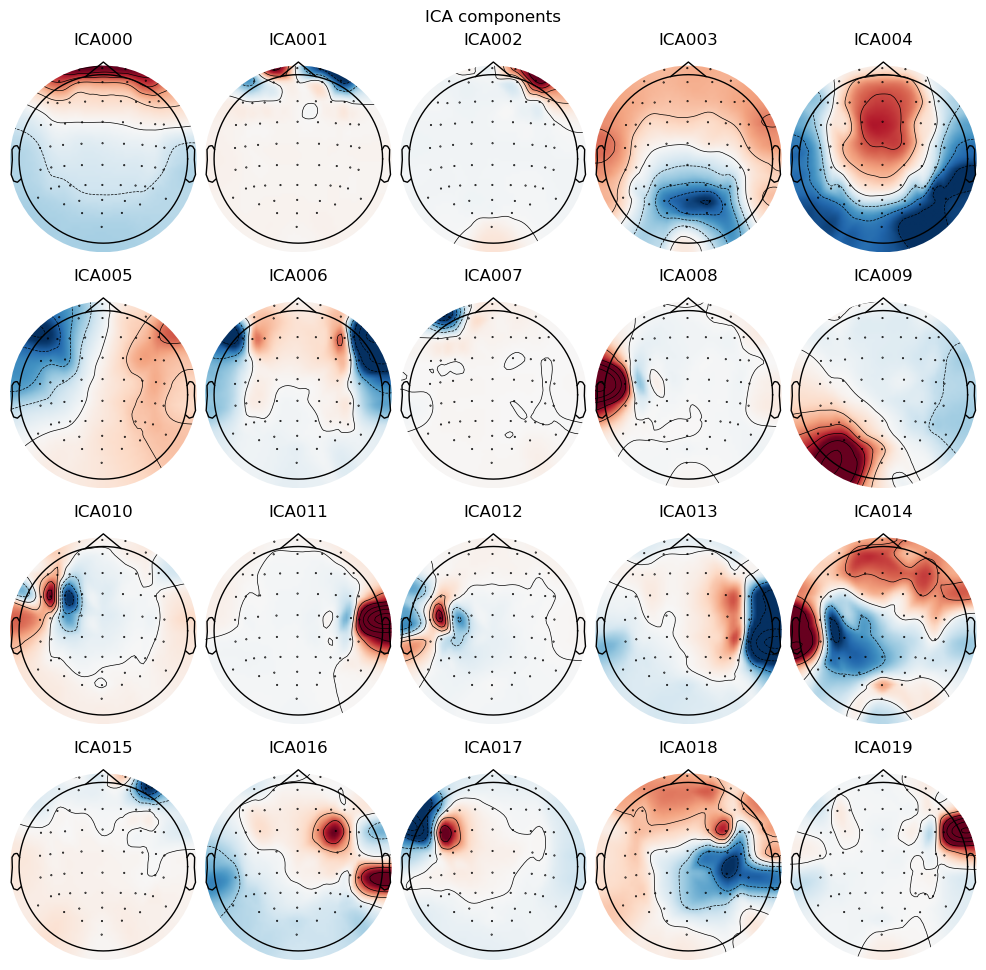

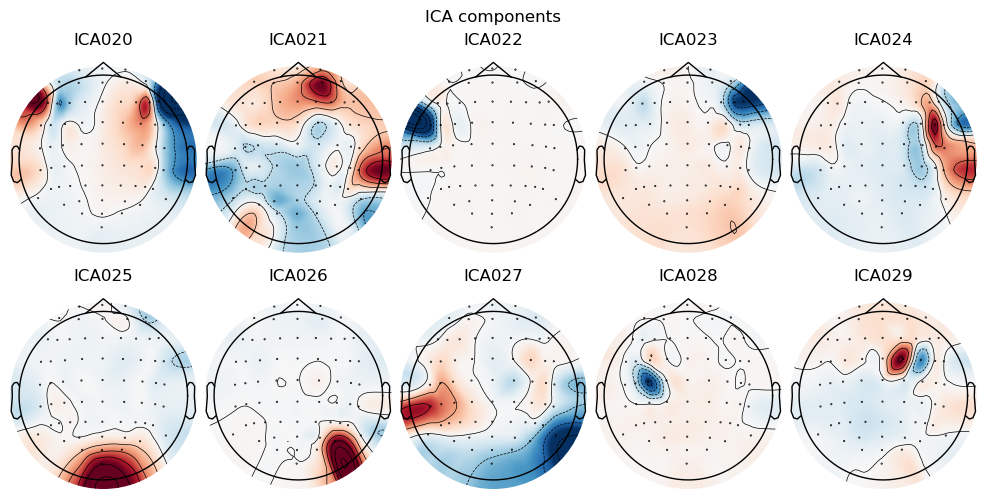

Not setting metadata
380 matching events found
No baseline correction applied
0 projection items activated


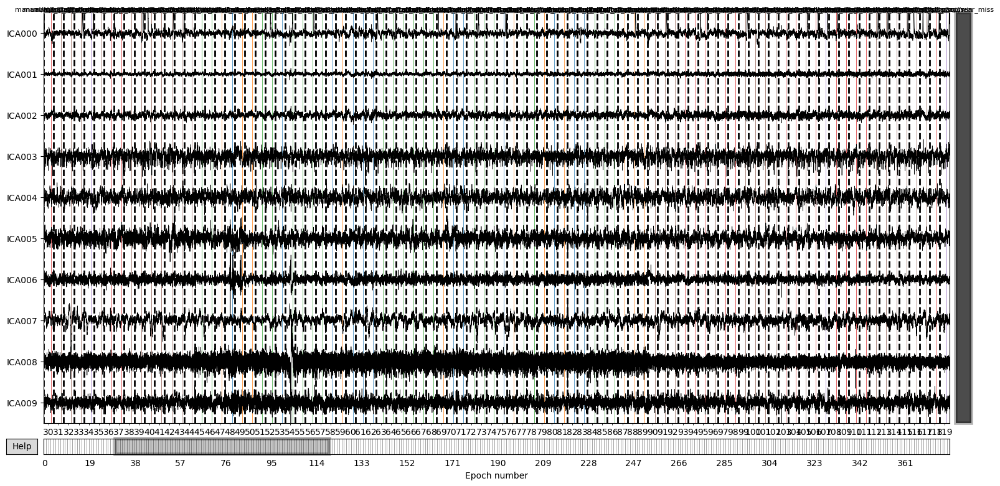

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
380 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
380 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
380 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
380 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
380 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
380 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
380 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
380 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
380 matching events found
No baseline correction applied
0 pro

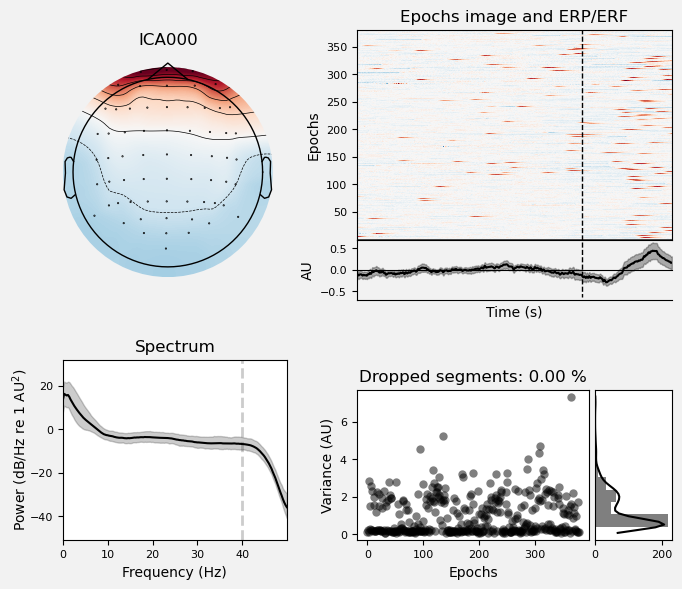

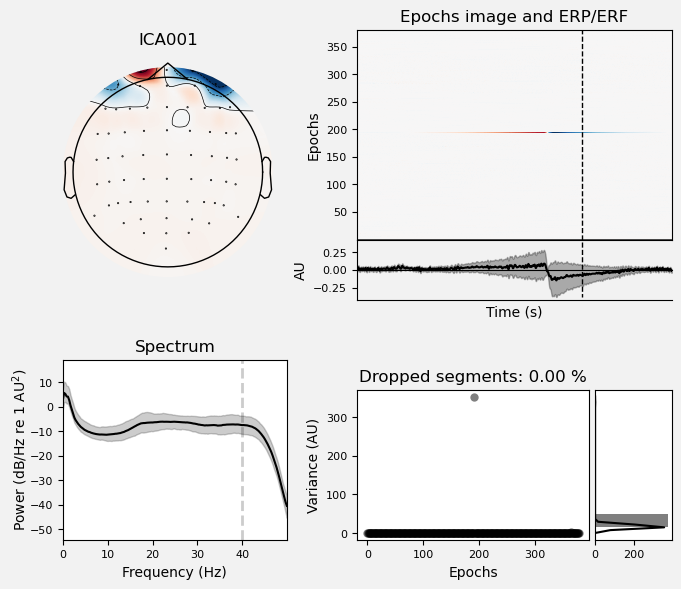

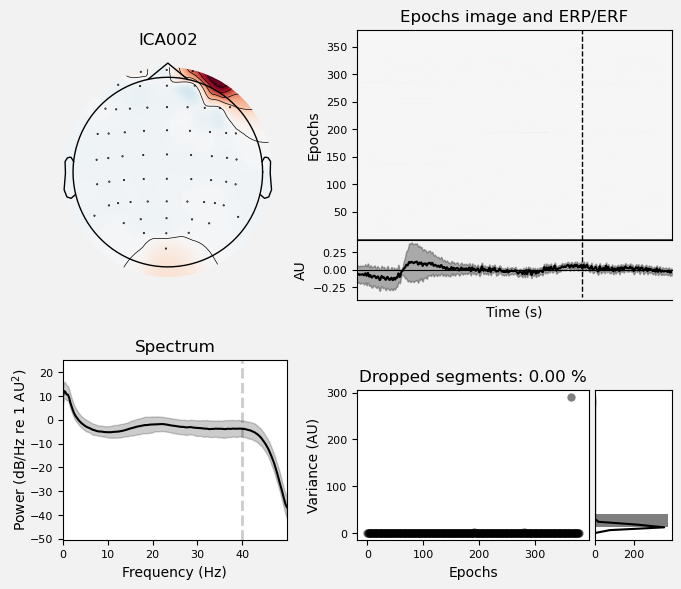

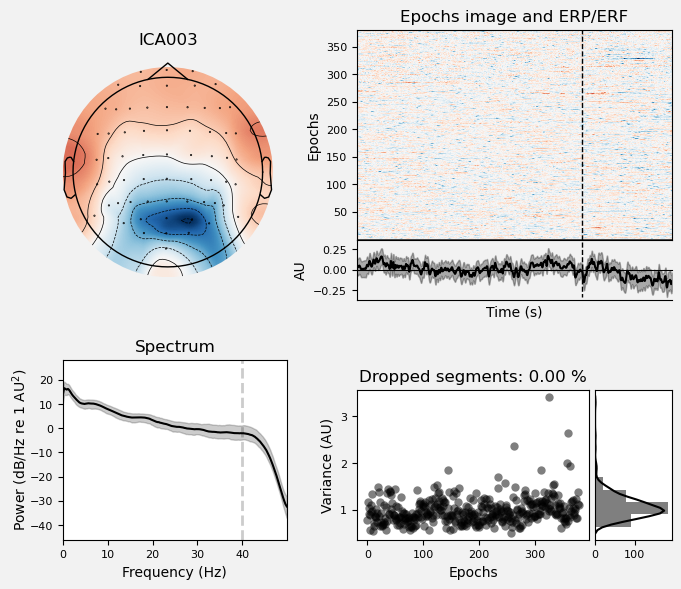

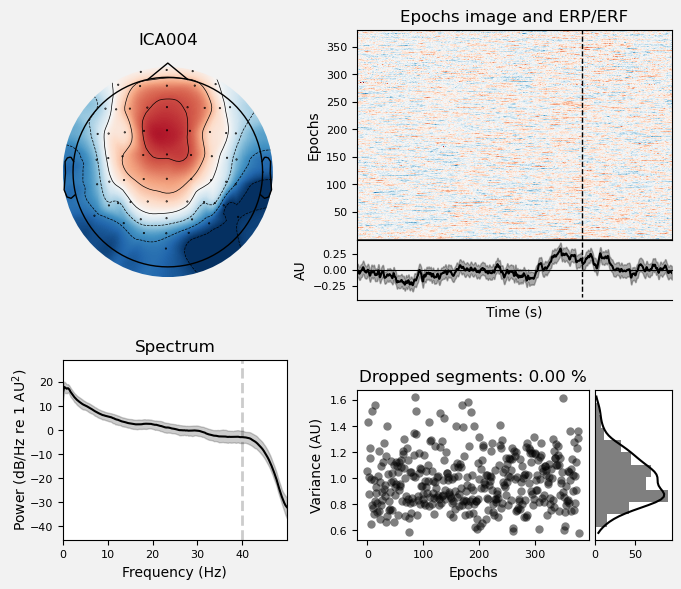

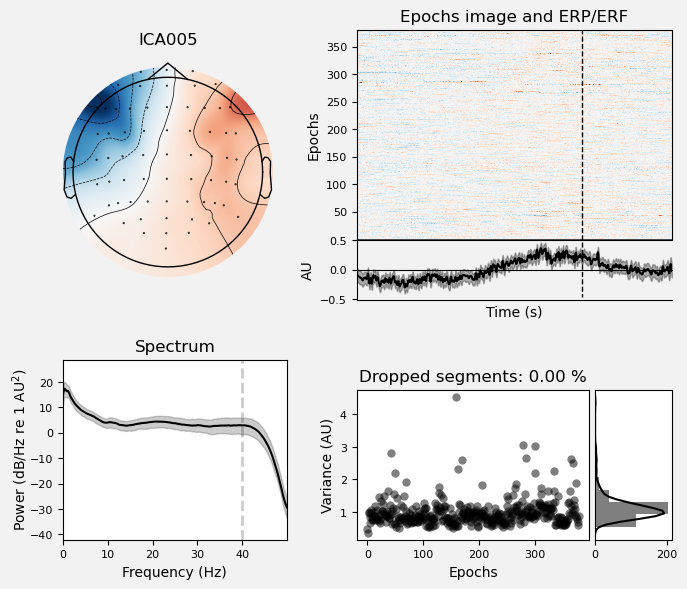

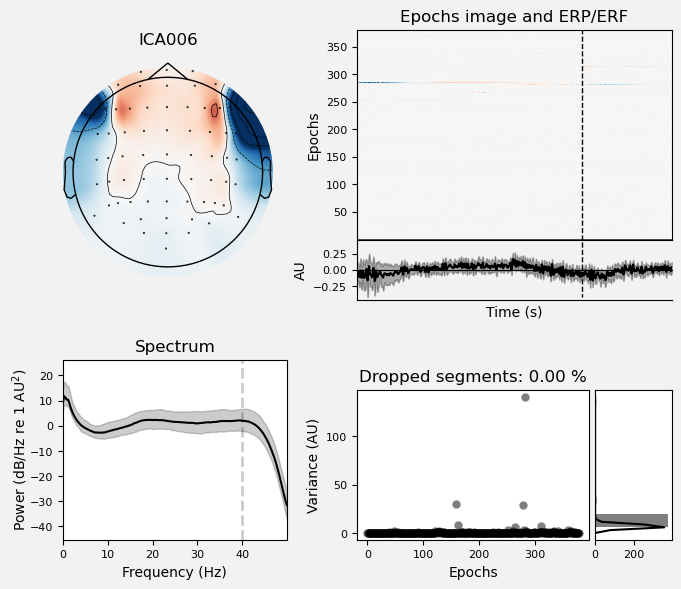

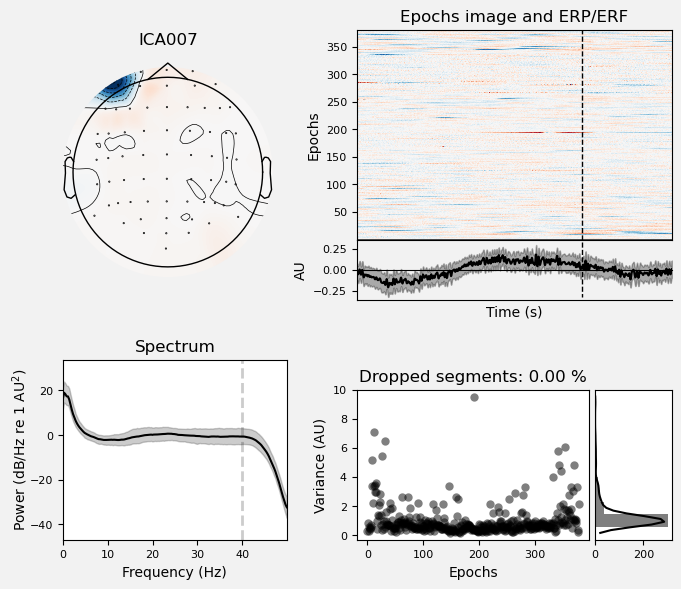

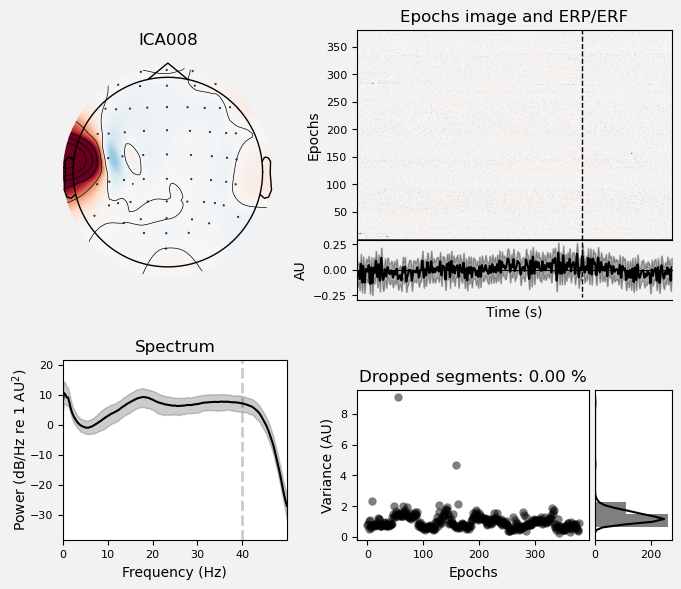

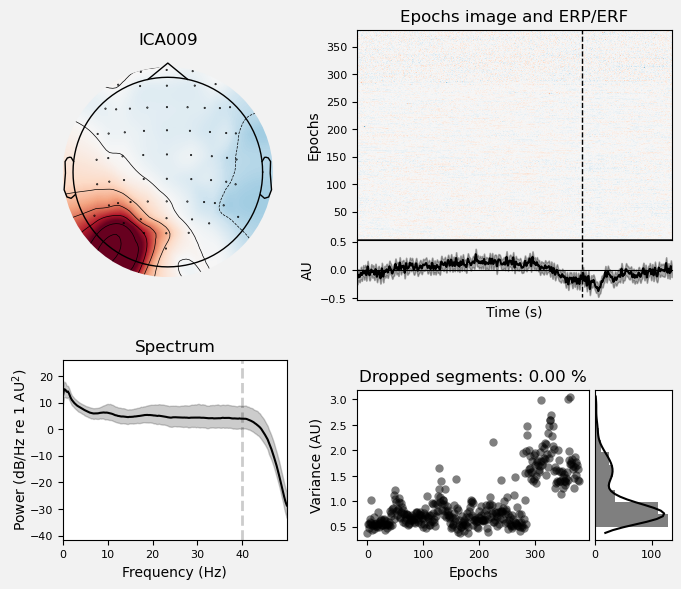

Not setting metadata
380 matching events found
No baseline correction applied
0 projection items activated


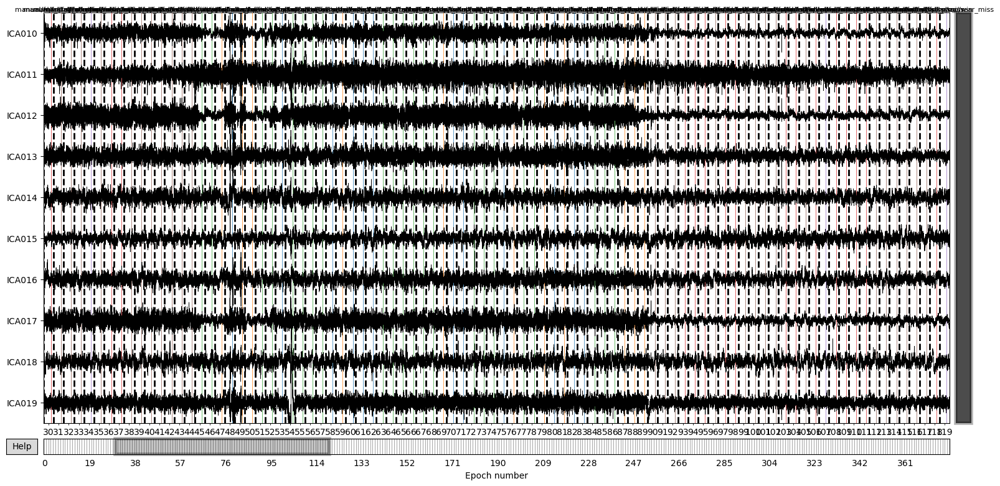

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
380 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
380 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
380 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
380 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
380 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
380 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
380 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
380 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
380 matching events found
No baseline correction applied
0 pro

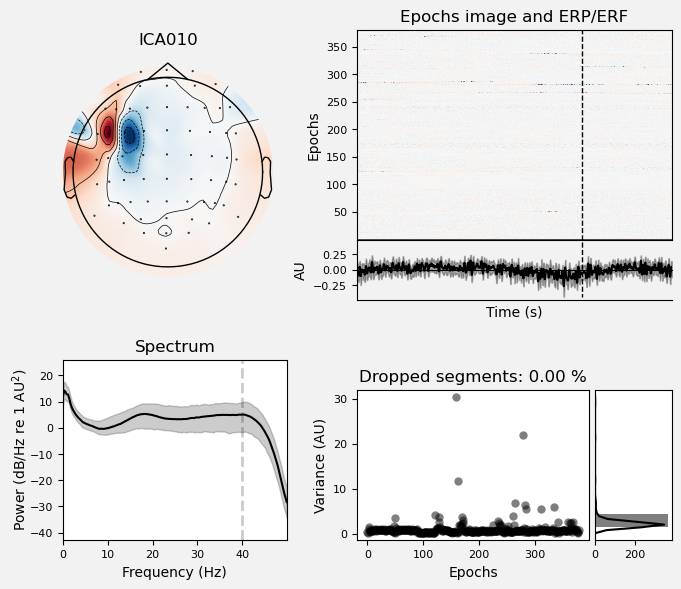

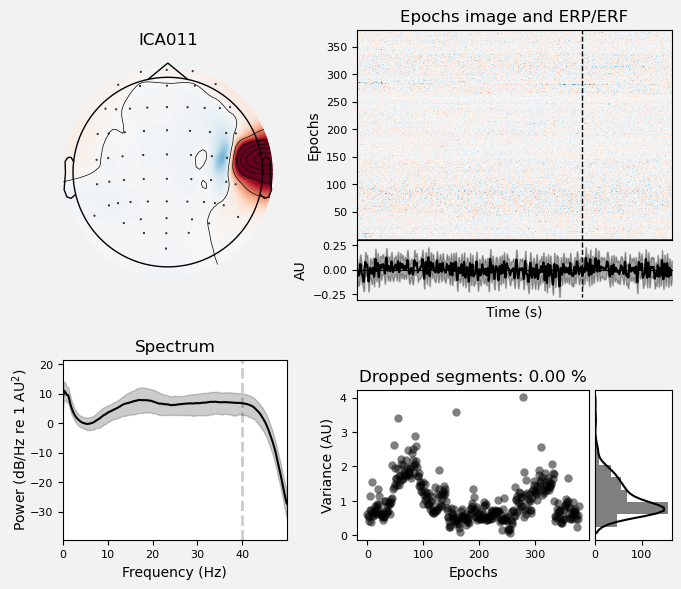

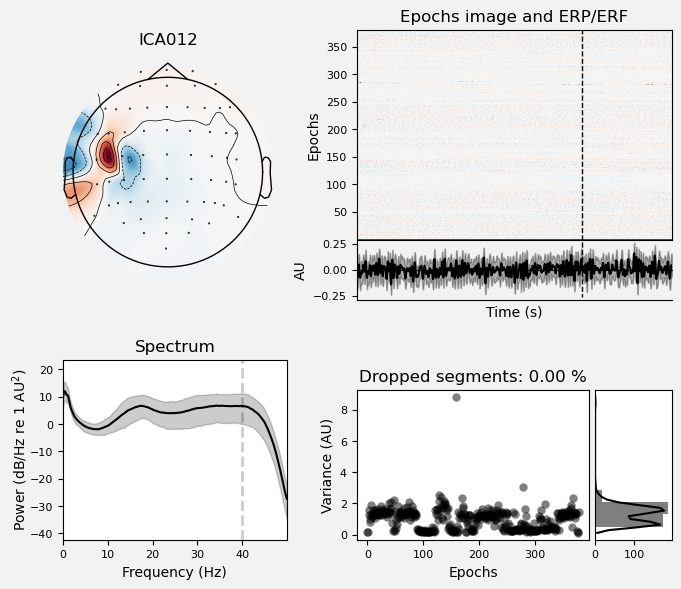

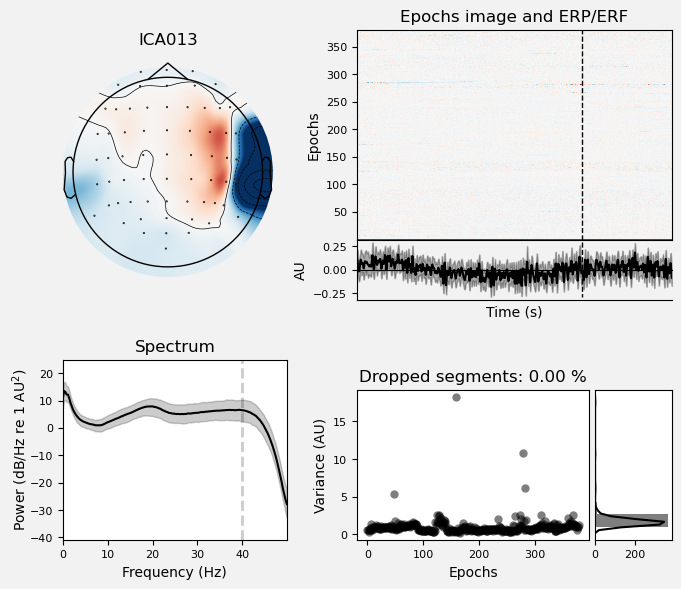

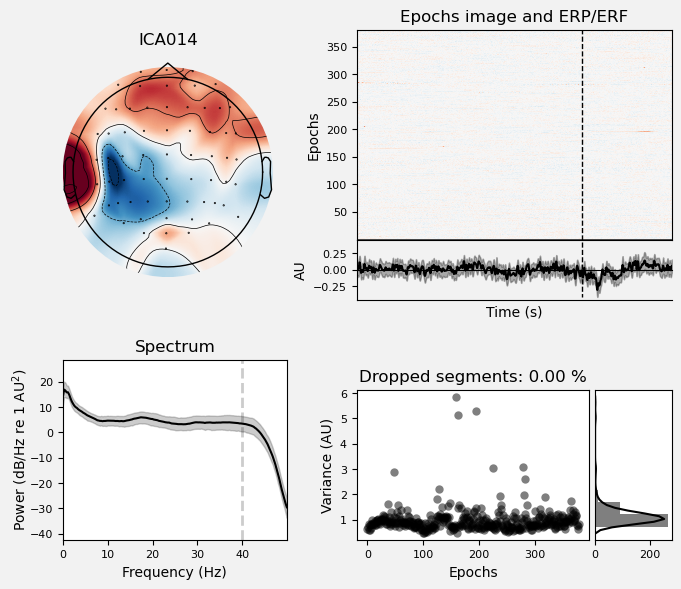

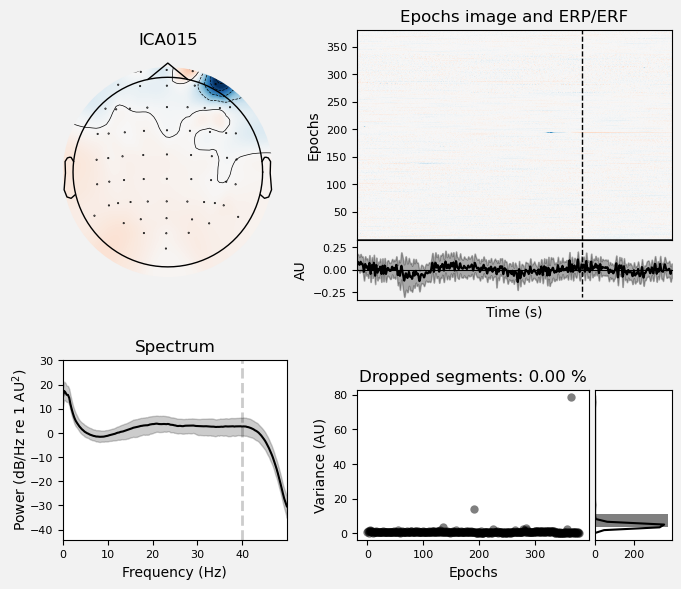

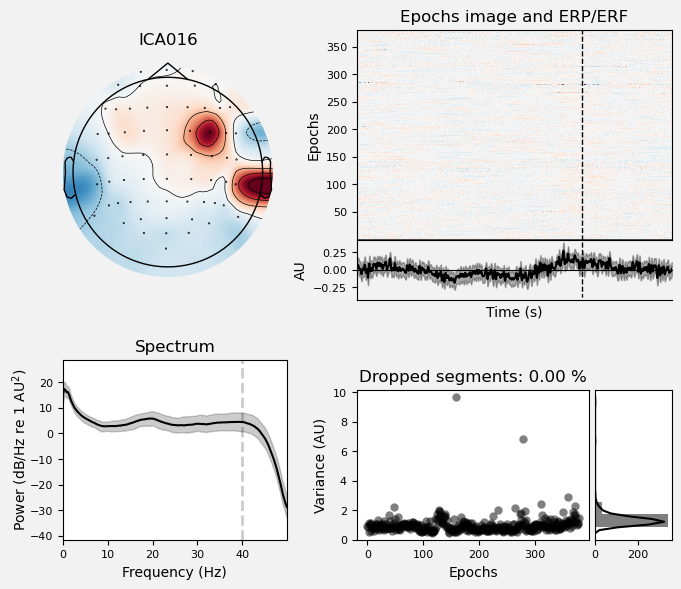

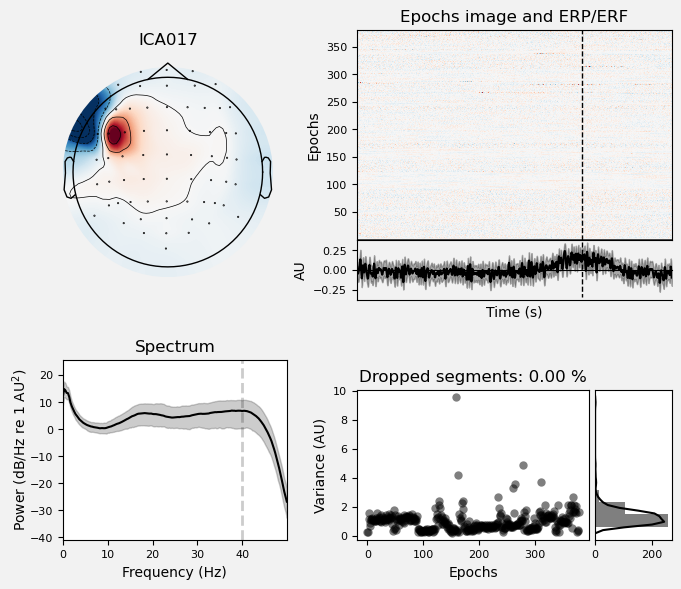

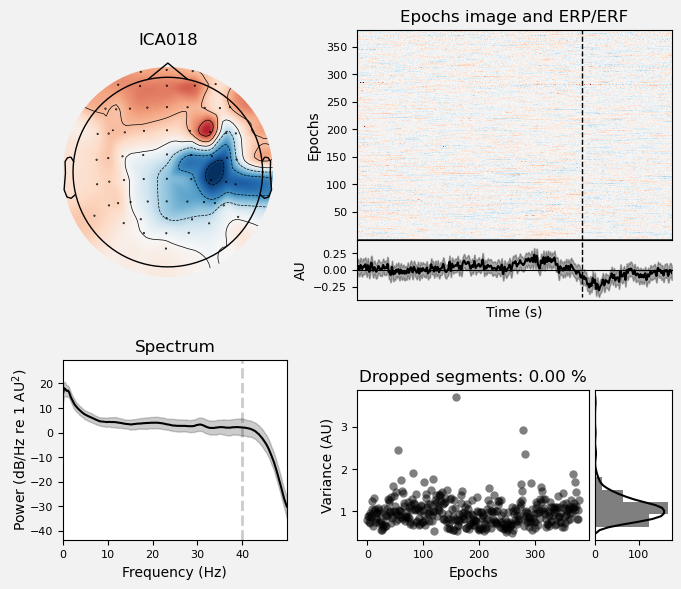

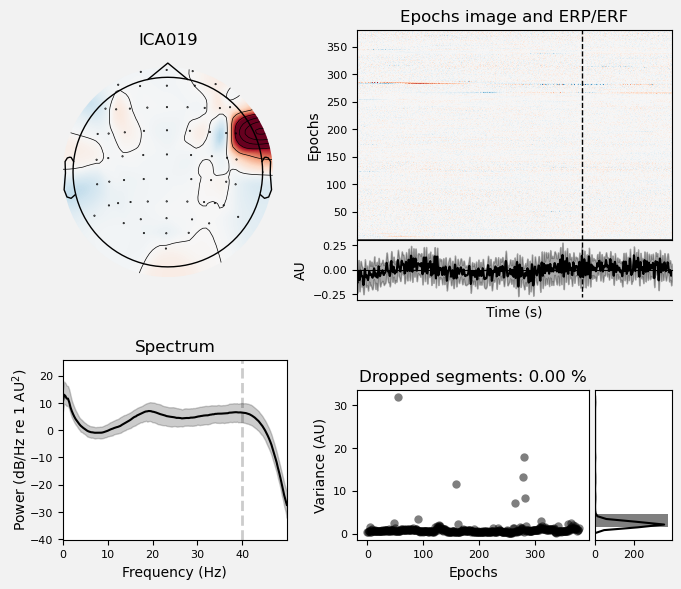

Not setting metadata
380 matching events found
No baseline correction applied
0 projection items activated


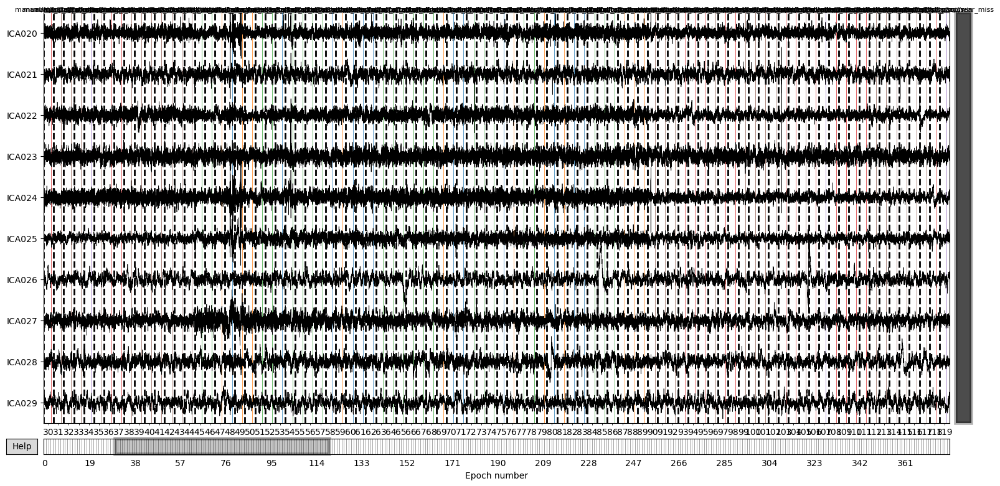

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
380 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
380 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
380 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
380 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
380 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
380 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
380 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
380 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
380 matching events found
No baseline correction applied
0 pro

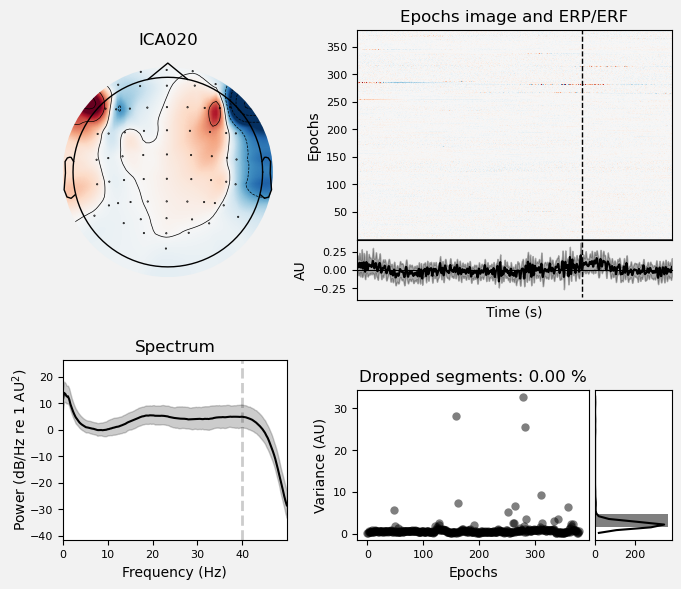

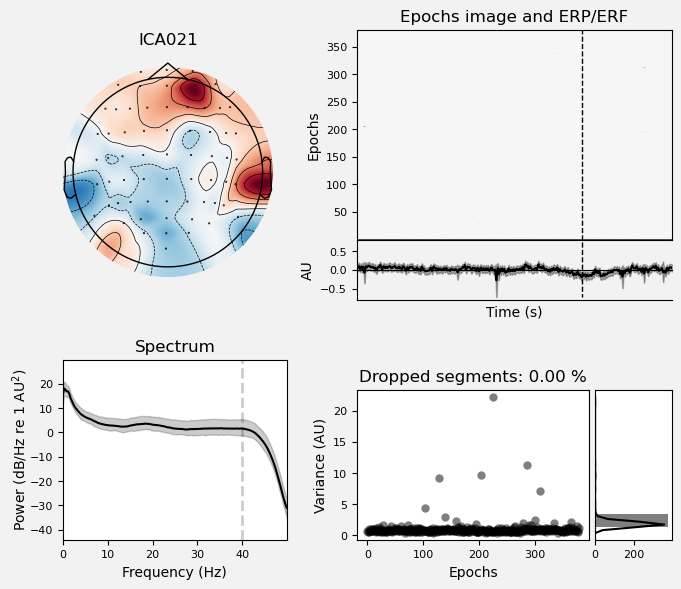

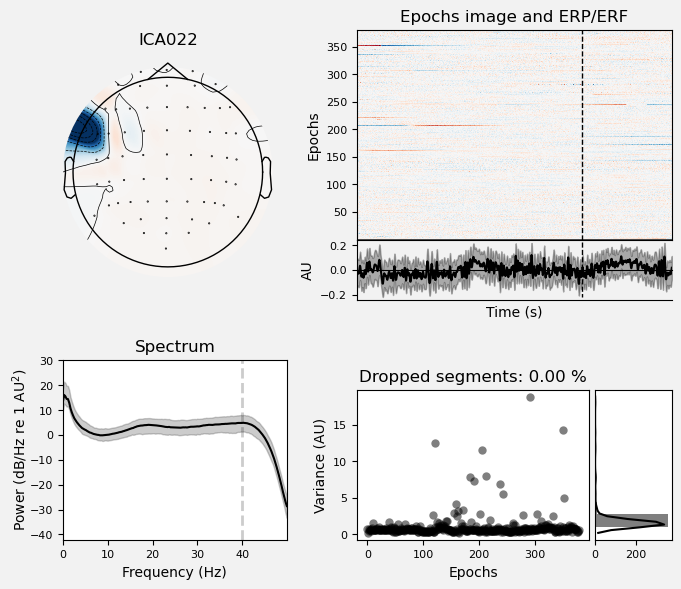

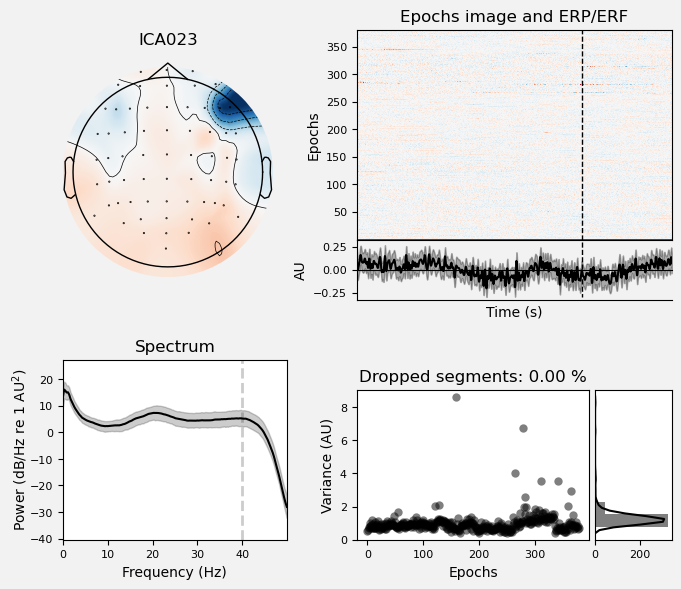

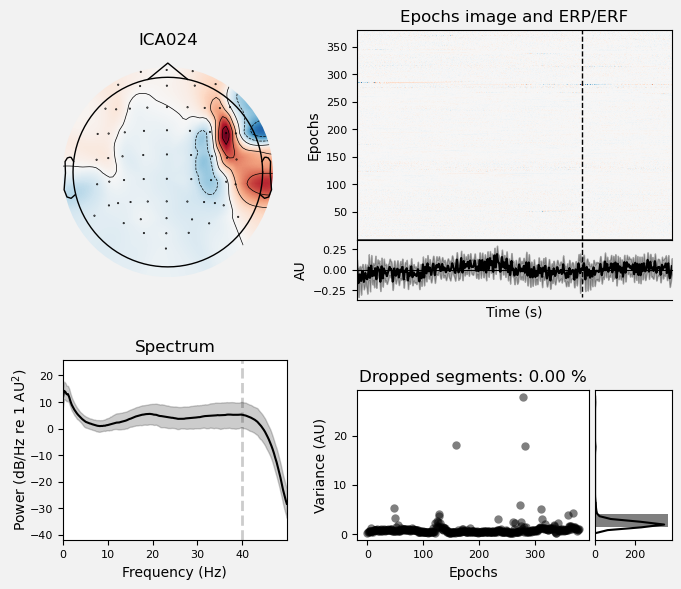

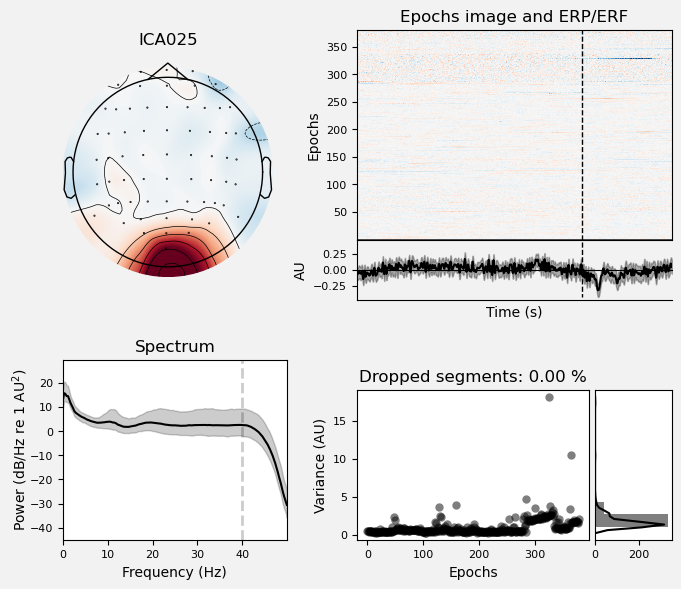

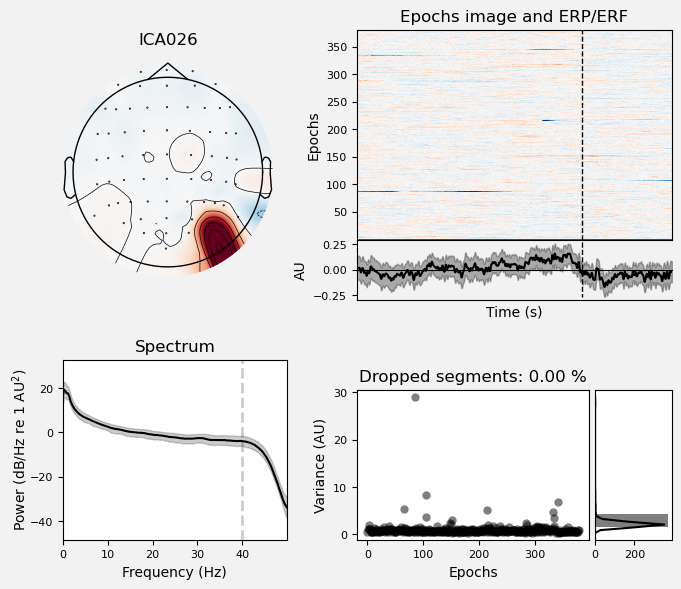

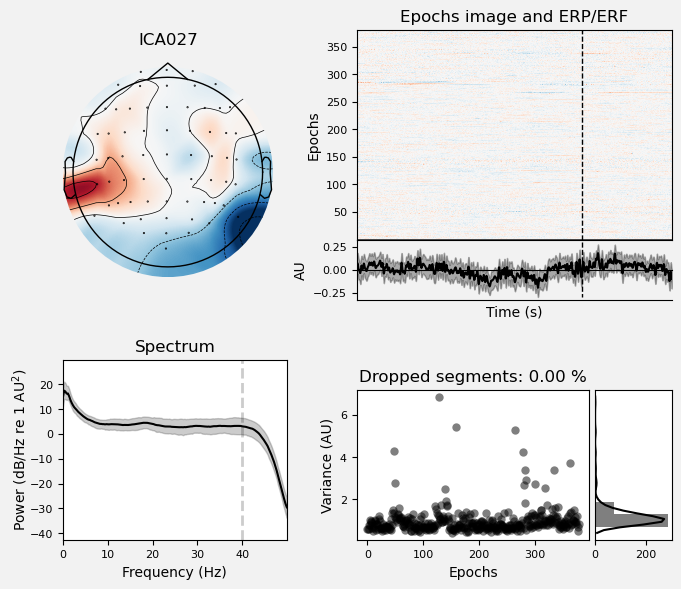

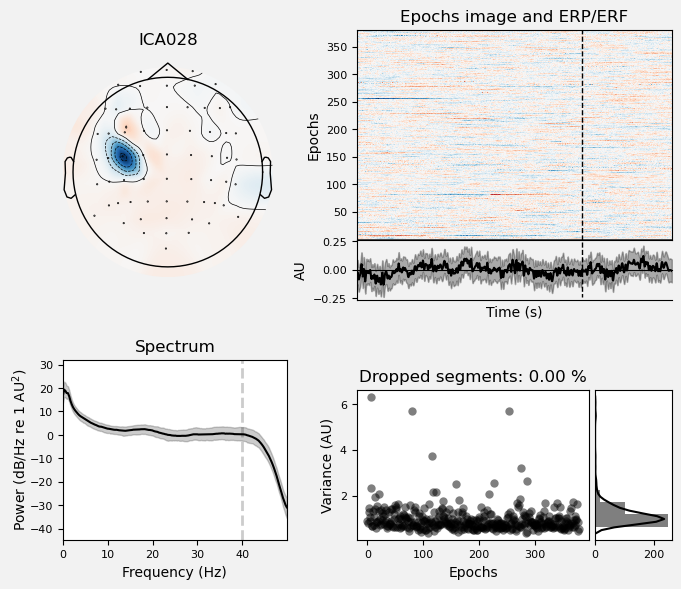

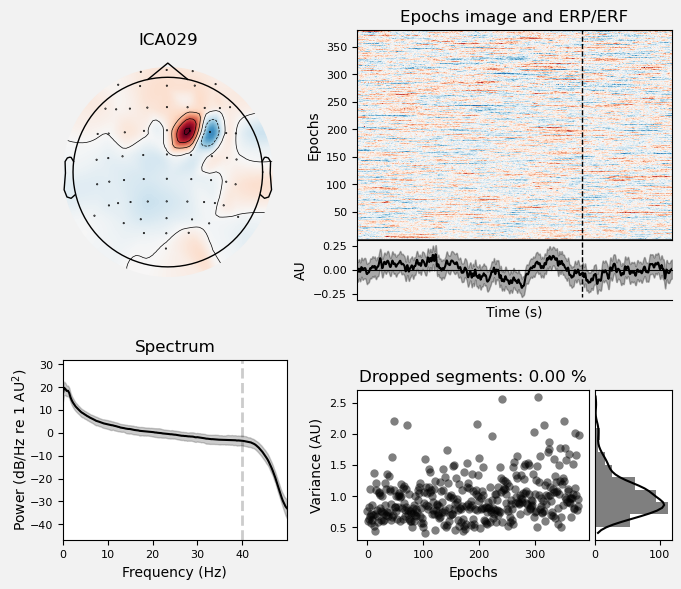

In [9]:
# =============================================================================
# Inspect ICA components
# =============================================================================
ica.plot_components()

for start, stop in [(0, 10), (10, 20), (20, 30)]:
    ica.plot_sources(
        epochs_full_stop,
        picks=range(start, stop),
        start=30,
        stop=120,
    )
    ica.plot_properties(
        epochs_full_stop,
        picks=range(start, stop),
    )


Applying ICA to Epochs instance
    Transforming to ICA space (30 components)
    Zeroing out 5 ICA components
    Projecting back using 64 PCA components


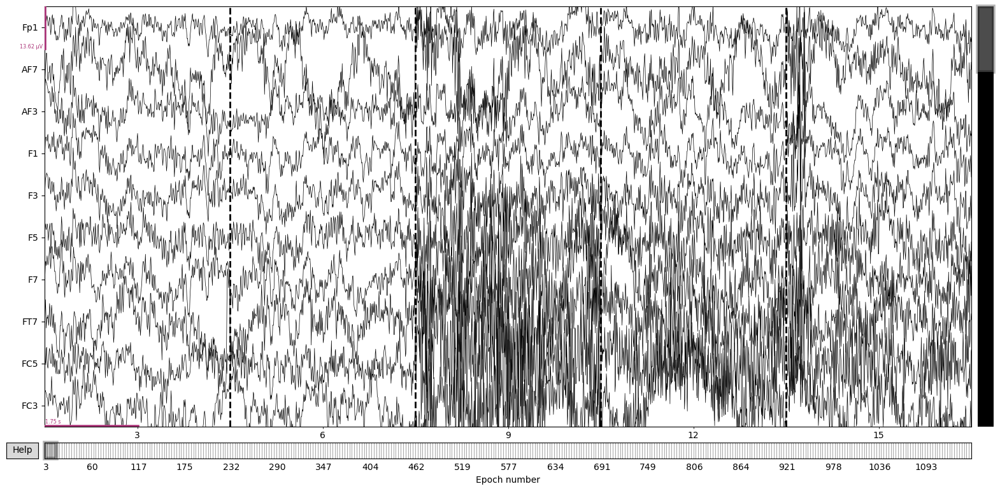

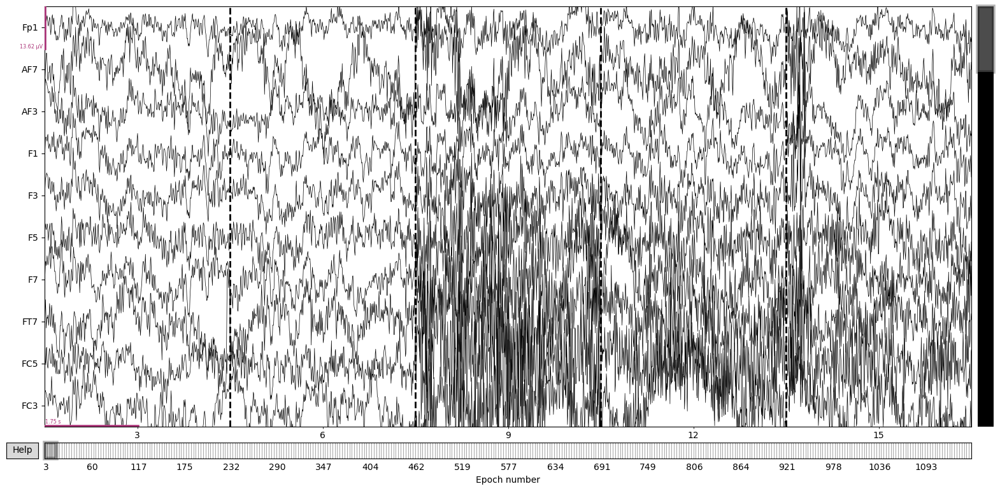

In [10]:
# =============================================================================
# Choose ICA components to remove and apply ICA
# =============================================================================
ica.exclude = [0, 1, 8, 11, 24]

epochs_ica = epochs_full_stop.copy()
ica.apply(epochs_ica)

epochs_ica.plot(n_epochs=5, n_channels=10, scalings="auto")


In [12]:
# =============================================================================
# Component-specific baseline correction
# =============================================================================
epochs_rewp_lpp_ica = epochs_ica.copy().apply_baseline(WINDOWS["RewP"]["baseline"])
epochs_spn_ica = epochs_ica.copy().apply_baseline(WINDOWS["SPN"]["baseline"])

# ERPs are created once and reused for simple waveform plots if needed.
erps_rewp_lpp = make_erps(epochs_rewp_lpp_ica)
erps_spn = make_erps(epochs_spn_ica)


Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)


## 4. Simple waveform plots


Not setting metadata
179 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
201 matching events found
Applying baseline correction (mode: mean)


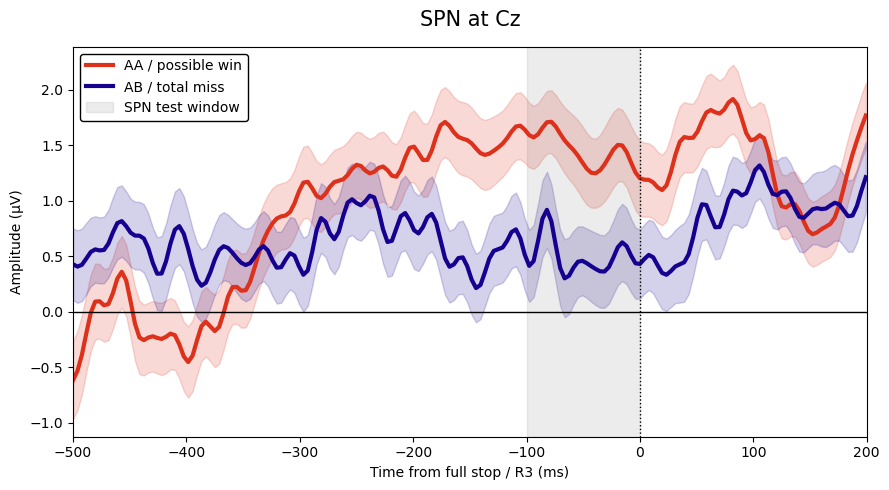

In [15]:
# SPN: AA possible-win vs AB total-miss
plot_two_condition_waveforms(
    epochs=epochs_spn_ica,
    groups=SPN_GROUPS,
    component="SPN",
    channel=WINDOWS["SPN"]["channel"],
    stat_window=WINDOWS["SPN"]["stat"],
    plot_window=(-0.500, 0.200),
    ylim=None,
)


Not setting metadata
89 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
90 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
201 matching events found
Applying baseline correction (mode: mean)


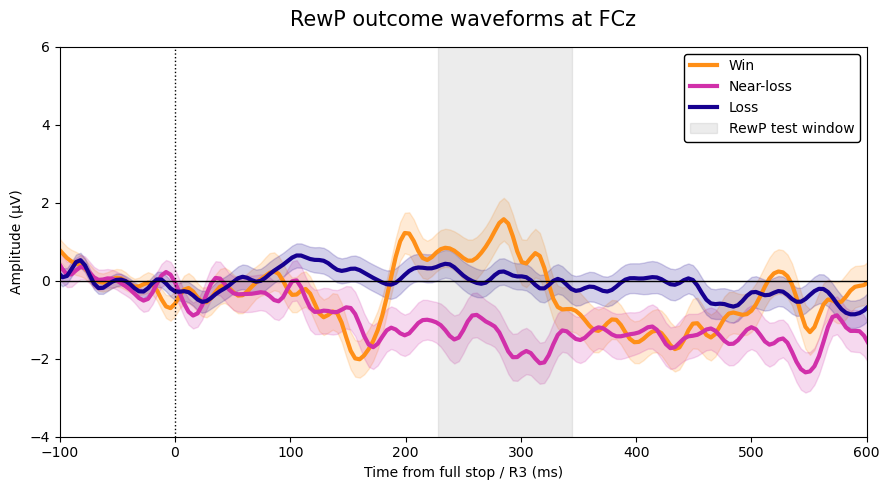

In [16]:
# RewP: win vs near-loss vs full-loss
plot_three_condition_waveforms(
    epochs=epochs_rewp_lpp_ica,
    groups=OUTCOME_GROUPS,
    component="RewP",
    channel=WINDOWS["RewP"]["channel"],
    stat_window=WINDOWS["RewP"]["stat"],
    plot_window=WINDOWS["RewP"]["plot"],
    ylim=(-4, 6),
)


Not setting metadata
89 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
90 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
201 matching events found
Applying baseline correction (mode: mean)


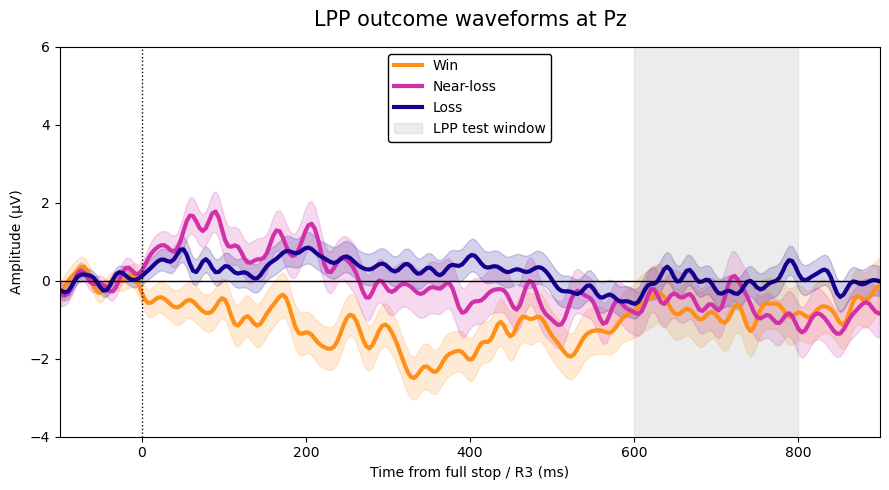

In [17]:
# LPP: win vs near-loss vs full-loss
plot_three_condition_waveforms(
    epochs=epochs_rewp_lpp_ica,
    groups=OUTCOME_GROUPS,
    component="LPP",
    channel=WINDOWS["LPP"]["channel"],
    stat_window=WINDOWS["LPP"]["stat"],
    plot_window=WINDOWS["LPP"]["plot"],
    ylim=(-4, 6),
)


## 5. Cluster-based permutation analyses


### 5.1 SPN: AA possible-win vs AB total-miss


Not setting metadata
179 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
201 matching events found
Applying baseline correction (mode: mean)

Trial-level SPN amplitude summary
----------------------------------
        condition   n  mean    sd   sem
AA / possible win 179 1.577 3.633 0.272
  AB / total miss 201 0.529 4.137 0.292
stat_fun(H1): min=1.7864751433892088 max=2.8033510923987346
Running initial clustering …
Found 1 cluster


  0%|          | Permuting : 0/4999 [00:00<?,       ?it/s]


Cluster-based permutation test: AA / possible win vs AB / total miss
----------------------------------------------------------
AA / possible win trials: 179
AB / total miss trials: 201
Degrees of freedom: 378

Cluster 1
p = 0.0054
time window = -101.6 to -7.8 ms
mean t-value = 2.305
SIGNIFICANT
Not setting metadata
179 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
201 matching events found
Applying baseline correction (mode: mean)


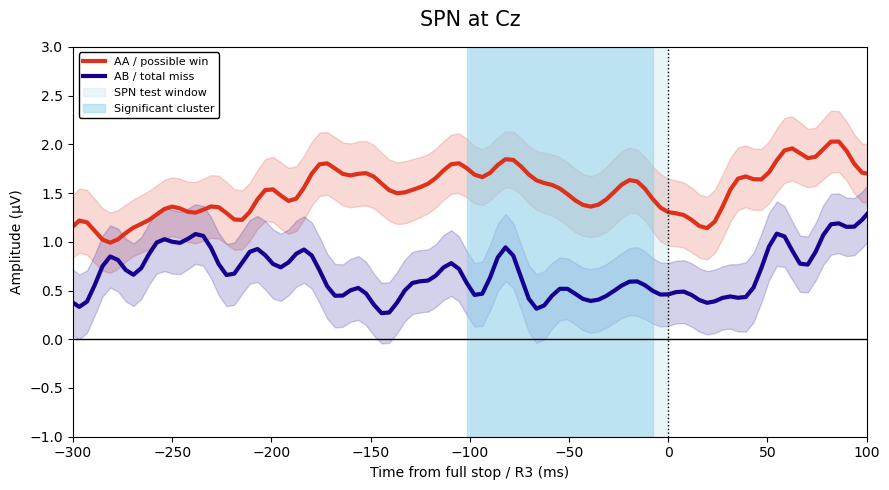

In [20]:
# =============================================================================
# SPN statistics
# =============================================================================
component = "SPN"
settings = WINDOWS[component]
channel = settings["channel"]
tmin, tmax = settings["stat"]
plot_tmin, plot_tmax = settings["plot"]

X_AA, times_spn, _ = get_trial_data(
    epochs_spn_ica,
    SPN_GROUPS["AA / possible win"],
    channel,
    tmin,
    tmax,
    unit="V",
)
X_AB, _, _ = get_trial_data(
    epochs_spn_ica,
    SPN_GROUPS["AB / total miss"],
    channel,
    tmin,
    tmax,
    unit="V",
)

# Descriptives in µV
X_AA_uv = X_AA * 1e6
X_AB_uv = X_AB * 1e6
spn_summary = print_summary_table(
    [
        summarise_trial_means(X_AA_uv, "AA / possible win"),
        summarise_trial_means(X_AB_uv, "AB / total miss"),
    ],
    component,
)

T_spn, clusters_spn, p_spn, H0_spn = run_two_condition_cluster_test(
    X_AA,
    X_AB,
    times_spn,
    "AA / possible win",
    "AB / total miss",
)

plot_two_condition_waveforms(
    epochs=epochs_spn_ica,
    groups=SPN_GROUPS,
    component=component,
    channel=channel,
    stat_window=(tmin, tmax),
    plot_window=(plot_tmin, plot_tmax),
    cluster_results=(T_spn, clusters_spn, p_spn, times_spn),
    ylim=(-1,3),
)


### 5.2 RewP: win vs near-loss vs full-loss


Not setting metadata
89 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
90 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
201 matching events found
Applying baseline correction (mode: mean)

Trial-level RewP amplitude summary
-----------------------------------
condition   n   mean    sd   sem
      Win  89  0.444 4.502 0.477
Near-loss  90 -1.558 4.696 0.495
Full-loss 201  0.095 4.207 0.297
stat_fun(H1): min=1.6749313030723243 max=9.372106399064489
Running initial clustering …
Found 2 clusters


  0%|          | Permuting : 0/4999 [00:00<?,       ?it/s]


Cluster-based permutation test: RewP outcome effect
--------------------------------------------------------------
Win trials: 89
Near-loss trials: 90
Full-loss trials: 201
df_between = 2
df_within = 377

Cluster 1
p = 0.0432
time window = 226.6 to 246.1 ms
mean F-value = 5.019
SIGNIFICANT

Cluster 2
p = 0.0048
time window = 269.5 to 324.2 ms
mean F-value = 6.392
SIGNIFICANT
Not setting metadata
89 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
90 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
201 matching events found
Applying baseline correction (mode: mean)


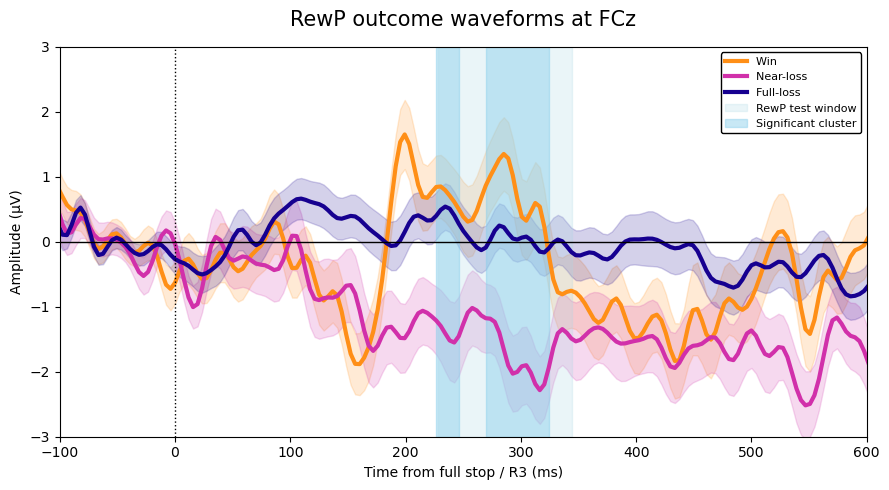

In [21]:
# =============================================================================
# RewP statistics
# =============================================================================
component = "RewP"
settings = WINDOWS[component]
channel = settings["channel"]
tmin, tmax = settings["stat"]
plot_tmin, plot_tmax = settings["plot"]

X_rewp = {}
times_rewp = None
for label, conditions in OUTCOME_GROUPS.items():
    X, times_rewp, _ = get_trial_data(
        epochs_rewp_lpp_ica,
        conditions,
        channel,
        tmin,
        tmax,
        unit="V",
    )
    X_rewp[label] = X

rewp_summary = print_summary_table(
    [summarise_trial_means(X * 1e6, label) for label, X in X_rewp.items()],
    component,
)

F_rewp, clusters_rewp, p_rewp, H0_rewp = run_three_condition_cluster_test(
    [X_rewp[label] for label in OUTCOME_GROUPS.keys()],
    times_rewp,
    list(OUTCOME_GROUPS.keys()),
    component,
)

plot_three_condition_waveforms(
    epochs=epochs_rewp_lpp_ica,
    groups=OUTCOME_GROUPS,
    component=component,
    channel=channel,
    stat_window=(tmin, tmax),
    plot_window=(plot_tmin, plot_tmax),
    cluster_results=(F_rewp, clusters_rewp, p_rewp, times_rewp),
    ylim=(-3, 3),
)


### 5.3 LPP: win vs near-loss vs full-loss


Not setting metadata
89 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
90 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
201 matching events found
Applying baseline correction (mode: mean)

Trial-level LPP amplitude summary
----------------------------------
condition   n   mean    sd   sem
      Win  89 -0.756 5.688 0.603
Near-loss  90 -0.570 4.853 0.512
Full-loss 201 -0.024 4.549 0.321
stat_fun(H1): min=0.04843443204485322 max=2.8606645278749596
Running initial clustering …
Found 0 clusters

Cluster-based permutation test: LPP outcome effect
--------------------------------------------------------------
Win trials: 89
Near-loss trials: 90
Full-loss trials: 201
df_between = 2
df_within = 377

No significant clusters were found.
Not setting metadata
89 matching events found
Applying baseline correction (mode: mean)


C:\Users\freja\AppData\Local\Temp\ipykernel_26272\3983275641.py:133: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  F_obs, clusters, cluster_p_values, H0 = permutation_cluster_test(


Not setting metadata
90 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
201 matching events found
Applying baseline correction (mode: mean)


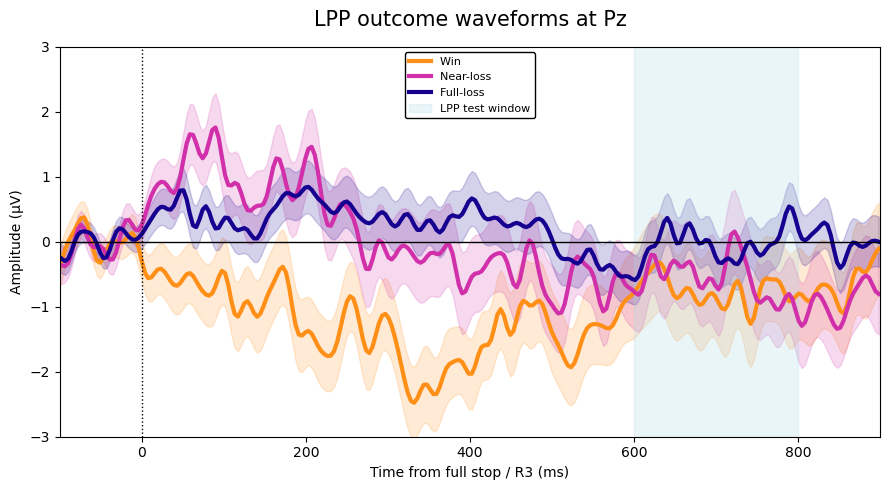

In [22]:
# =============================================================================
# LPP statistics
# =============================================================================
component = "LPP"
settings = WINDOWS[component]
channel = settings["channel"]
tmin, tmax = settings["stat"]
plot_tmin, plot_tmax = settings["plot"]

X_lpp = {}
times_lpp = None
for label, conditions in OUTCOME_GROUPS.items():
    X, times_lpp, _ = get_trial_data(
        epochs_rewp_lpp_ica,
        conditions,
        channel,
        tmin,
        tmax,
        unit="V",
    )
    X_lpp[label] = X

lpp_summary = print_summary_table(
    [summarise_trial_means(X * 1e6, label) for label, X in X_lpp.items()],
    component,
)

F_lpp, clusters_lpp, p_lpp, H0_lpp = run_three_condition_cluster_test(
    [X_lpp[label] for label in OUTCOME_GROUPS.keys()],
    times_lpp,
    list(OUTCOME_GROUPS.keys()),
    component,
)

plot_three_condition_waveforms(
    epochs=epochs_rewp_lpp_ica,
    groups=OUTCOME_GROUPS,
    component=component,
    channel=channel,
    stat_window=(tmin, tmax),
    plot_window=(plot_tmin, plot_tmax),
    cluster_results=(F_lpp, clusters_lpp, p_lpp, times_lpp),
    ylim=(-3, 3),
)


## 6. Summary


In [23]:
# Combine the descriptive output tables into one reporting table.
report_summary = pd.concat(
    [
        spn_summary.assign(component="SPN"),
        rewp_summary.assign(component="RewP"),
        lpp_summary.assign(component="LPP"),
    ],
    ignore_index=True,
)

report_summary = report_summary[
    ["component", "condition", "n", "mean", "sd", "sem"]
]

print(report_summary.round(3).to_string(index=False))


component         condition   n   mean    sd   sem
      SPN AA / possible win 179  1.577 3.633 0.272
      SPN   AB / total miss 201  0.529 4.137 0.292
     RewP               Win  89  0.444 4.502 0.477
     RewP         Near-loss  90 -1.558 4.696 0.495
     RewP         Full-loss 201  0.095 4.207 0.297
      LPP               Win  89 -0.756 5.688 0.603
      LPP         Near-loss  90 -0.570 4.853 0.512
      LPP         Full-loss 201 -0.024 4.549 0.321
